# Improving Sentiment Analysis with Multi-task Learning of Negation - Model Training

## Mount the drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'Emerging_tech_project/multitask_negation_for_sa-master/models/'

Mounted at /content/gdrive


## Change directory

In [ ]:
%cd /content/gdrive/My\ Drive/Emerging_tech_project/multitask_negation_for_sa-master/models

/content/gdrive/.shortcut-targets-by-id/1LZMfkPzwVMgPkg4s6U8ehgsDg9iIxHxX/Emerging_tech_project/multitask_negation_for_sa-master/models


## Install libraries

In [ ]:
!pip install tensorboard

## Import required libraries

In [ ]:
pip install import_ipynb

  Created wheel for import-ipynb: filename=import_ipynb-0.1.3-cp36-none-any.whl size=2976 sha256=3b739d703495ffdd9b4f2071990b7257cec1450ef062f4b9fc9109e53115313a
  Stored in directory: /root/.cache/pip/wheels/b4/7b/e9/a3a6e496115dffdb4e3085d0ae39ffe8a814eacc44bbf494b5
Successfully built import-ipynb


In [ ]:
import torch
import torch.autograd as autograd
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.nn.utils.rnn import pack_padded_sequence, pad_packed_sequence, PackedSequence
from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard

from Utils.WordVecs import WordVecs
from Utils.utils import *

import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from collections import defaultdict
from Utils.sst import SSTDataset
from torch.utils.data import DataLoader

import os
import argparse
import pickle

from hierarchical_model import *
# import import_ipynb 
# from ModelTest import *

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## SetVocab Class

In [ ]:
class SetVocab(dict):
    def __init__(self, vocab):
        self.update(vocab)

    def ws2ids(self, ws):
        return [self[w] if w in self else 0 for w in ws]

    def ids2sent(self, ids):
        idx2w = dict([(i, w) for w, i in self.items()])
        return [idx2w[int(i)] if i in idx2w else "UNK" for i in ids]

## Vocab Class

  1. init method: set UNK token to 0 index

---


  2. ws2ids: If train, you can use the default dict to add tokens
  to the vocabulary, given these will be updated during
  training. Otherwise, we replace them with UNK.

---


      

In [ ]:
class Vocab(defaultdict):
    def __init__(self, train=True):
        super().__init__(lambda : len(self))
        self.train = train
        self.UNK = "UNK"
        self[self.UNK]

    def ws2ids(self, ws):
        if self.train:
            return [self[w] for w in ws]
        else:
            return [self[w] if w in self else 0 for w in ws]

    def ids2sent(self, ids):
        idx2w = dict([(i, w) for w, i in self.items()])
        return [idx2w[int(i)] if i in idx2w else "UNK" for i in ids]

In [ ]:
def prepare_sequence(seq, to_ix):
    idxs = [to_ix[w] for w in seq]
    return torch.tensor(idxs, dtype=torch.long)

## Train the model

1. Save the model parameters to params.pkl file.
2. SummaryWriter: for writing in tensorboard.
3. Using the Hierarchical_Model from imports. Model definition in hierarchical_models.py file
4. Set our optimizers - sentiment_optimizer and auxillary_optimizer.
5. Train the model and log the losses in forward and backward passes.
6. Get the F1 score, accuracy, sentiment score and loss, actual and predicted values for visualization.

In [ ]:
def train_model(vocab,
                new_matrix,
                tag_to_ix,
                num_labels,
                task2label2id,
                embedding_dim,
                hidden_dim,
                num_lstm_layers,
                train_embeddings,
                auxiliary_trainX,
                auxiliary_trainY,
                auxiliary_testX,
                auxiliary_testY,
                maintask_loader,
                maintask_train_iter,
                maintask_dev_iter,
                AUXILIARY_TASK=None,
                epochs=10,
                sentiment_learning_rate=0.001,
                auxiliary_learning_rate=0.0001,
                BATCH_SIZE=50,
                number_of_runs=5,
                random_seeds=[123, 456, 789, 101112, 131415],
                DATASET="SST",
                FINE_GRAINED="fine"
                ):

    print("7. Train Model Function" )
    print() 

    param_file = (dict(vocab.items()),
                  new_matrix.shape,
                  tag_to_ix,
                  num_labels,
                  task2label2id)
    
    print("8. Param File: ", param_file)
    print()

    basedir = os.path.join("saved_models",
                           "{0}-{1}".format(DATASET, FINE_GRAINED),
                           args.AUXILIARY_TASK)
    outfile = os.path.join(basedir,
                           "params.pkl")
    print("9. Saving model parameters to " + outfile)
    print()

    os.makedirs(basedir, exist_ok=True)

    with open(outfile, "wb") as out:
        pickle.dump(param_file, out)

    for i, run in enumerate(range(number_of_runs)):
        train_loss_log = []
        train_acc_log = []
        valid_acc_log = []
        tb = SummaryWriter()
        model = Hierarchical_Model(vocab,
                                   new_matrix,
                                   tag_to_ix,
                                   num_labels,
                                   task2label2id,
                                   embedding_dim,
                                   hidden_dim,
                                   1,
                                   train_embeddings=train_embeddings)

        
        sentiment_params = list(model.word_embeds.parameters()) + \
                           list(model.lstm1.parameters()) +\
                           list(model.lstm2.parameters()) +\
                           list(model.linear.parameters())

        auxiliary_params = list(model.word_embeds.parameters()) + \
                           list(model.lstm1.parameters()) +\
                           list(model.hidden2tag.parameters()) +\
                           [model.transitions]

        sentiment_optimizer = torch.optim.Adam(sentiment_params, lr=sentiment_learning_rate)
        auxiliary_optimizer = torch.optim.Adam(auxiliary_params, lr=auxiliary_learning_rate)

        print("RUN {0}".format(run + 1))
        best_dev_acc = 0.0

        # set random seed for reproducibility
        np.random.seed(random_seeds[i])
        torch.manual_seed(random_seeds[i])

        for j, epoch in enumerate(range(epochs)):

            # If AUXILIARY_TASK is None, defaults to single task
            if AUXILIARY_TASK not in ["None", "none", 0, None]:

                print("epoch {0}: ".format(epoch + 1), end="")
                for k in tqdm(range(len(auxiliary_trainX))):
                    # Step 1. Remember that Pytorch accumulates gradients.
                    # We need to clear them out before each instance
                    model.zero_grad()

                    # Step 2. Get our inputs ready for the network, that is,
                    # turn them into Tensors of word indices.
                    sentence_in = torch.tensor(auxiliary_trainX[k])
                    targets = torch.tensor(auxiliary_trainY[k][AUXILIARY_TASK])

                    # Step 3. Run our forward pass.
                    loss = model.neg_log_likelihood(sentence_in, targets)
                    
                    # Step 4. Compute the loss, gradients, and update the parameters by
                    # calling optimizer.step()
                    loss.backward()
                    auxiliary_optimizer.step()
                # print("=============AUX===============")
                # model.eval_aux(auxiliary_testX, auxiliary_testY,
                #               taskname=AUXILIARY_TASK)
                # print("=============AUX===============")
            batch_losses = 0
            num_batches = 0
            model.train()

            print("epoch {0}".format(epoch + 1))

            for sents, targets in maintask_loader:
                model.zero_grad()

                loss = model.pooled_sentiment_loss(sents, targets)
                batch_losses += loss.data
                num_batches += 1

                loss.backward()
                sentiment_optimizer.step()

            print("loss: {0:.3f}".format(batch_losses / num_batches))

            # ...log the running loss
            tb.add_scalar('training loss', batch_losses / num_batches, epoch)
            train_loss_log.append(batch_losses / num_batches)

            model.eval()
            f1, acc, preds, ys = model.eval_sent(maintask_train_iter,
                                                 batch_size=BATCH_SIZE)
            
            tb.add_scalar('Train accuracy', acc, epoch)
            train_acc_log.append(acc)

            f1, acc, preds, ys = model.eval_sent(maintask_dev_iter,
                                                 batch_size=BATCH_SIZE)
            tb.add_scalar('Validation accuracy', acc, epoch)
            valid_acc_log.append(acc)

            if acc > best_dev_acc:
                best_dev_acc = acc
                print("NEW BEST DEV ACC: {0:.3f}".format(acc))

                basedir = os.path.join("saved_models", "{0}-{1}".format(DATASET, FINE_GRAINED),
                                       AUXILIARY_TASK,
                                       "{0}".format(run + 1))
                outname = "epochs:{0}-lstm_dim:{1}-lstm_layers:{2}-devacc:{3:.3f}.pth".format(epoch + 1, model.lstm1.hidden_size, model.lstm1.num_layers, acc)
                modelfile = os.path.join(basedir,
                                         outname)
                os.makedirs(basedir, exist_ok=True)
                print("saving model to {0}".format(modelfile))
                torch.save(model, modelfile)
                print()

        plt.title('Training and Validation accuracy')
        plt.plot(train_loss_log,label='Train Loss')
        plt.plot(train_acc_log,label='Train Accuracy')
        plt.plot(valid_acc_log,label='Val Accuracy')
        plt.legend(loc='best')
        plt.grid()
        plt.show()
      

## Main Function


**Arguments Used:**


* AUXILIARY_DATASET= \preprocessed/starsem_negation/cdt.conllu
* AUXILIARY_LR=0.0001
* AUXILIARY_TASK='negation_scope'
* BATCH_SIZE=50
* DATASET='SST'
* EMBEDDINGS='../../embeddings/google.txt'
* EMBEDDING_DIM=300
* HIDDEN_DIM=100
* NUM_LAYERS=1
* SENTIMENT_LR=0.001
* TRAIN_EMBEDDINGS=True



In [ ]:
if __name__ == "__main__":

    parser = argparse.ArgumentParser()
    parser.add_argument("--NUM_LAYERS", "-nl", default=1, type=int)
    parser.add_argument("--HIDDEN_DIM", "-hd", default=100, type=int)
    parser.add_argument("--BATCH_SIZE", "-bs", default=50, type=int)
    parser.add_argument("--EMBEDDING_DIM", "-ed", default=300, type=int)
    parser.add_argument("--TRAIN_EMBEDDINGS", "-te", action="store_false")
    parser.add_argument("--AUXILIARY_TASK", "-aux", default="negation_scope")
    parser.add_argument("--EMBEDDINGS", "-emb",
                        default="../../embeddings/google.txt")
    parser.add_argument("--DATA_DIR", "-dd",
                        default="../data/datasets/en")
    parser.add_argument("--DATASET", "-data",
                        default="SST")
    #parser.add_argument("--AUXILIARY_DATASET", "-auxdata",
    #                    default="preprocessed/starsem_negation/cdt.conllu")
    parser.add_argument("--AUXILIARY_DATASET", "-auxdata",
                        default="preprocessed/starsem_negation/cdd.conllu")
    parser.add_argument("--SENTIMENT_LR", "-slr", default=0.001, type=float)
    parser.add_argument("--AUXILIARY_LR", "-alr", default=0.0001, type=float)
    parser.add_argument("--FINE_GRAINED", "-fg",
                        default="fine",
                        help="Either 'fine' or 'binary' (defaults to 'fine'.")

In [ ]:
    args = parser.parse_args()
    print("1. Arguments: \n ", args)

1. Arguments: 
  Namespace(AUXILIARY_DATASET='preprocessed/starsem_negation/cdd.conllu', AUXILIARY_LR=0.0001, AUXILIARY_TASK='negation_scope', BATCH_SIZE=50, DATASET='SST', DATA_DIR='../data/datasets/en', EMBEDDINGS='../../embeddings/google.txt', EMBEDDING_DIM=300, FINE_GRAINED='/root/.local/share/jupyter/runtime/kernel-db574657-5ab2-4ccf-8f18-9c764f13d9ba.json', HIDDEN_DIM=100, NUM_LAYERS=1, SENTIMENT_LR=0.001, TRAIN_EMBEDDINGS=True)


In [ ]:
    START_TAG = "<START>"
    STOP_TAG = "<STOP>"

    args.FINE_GRAINED = "fine"
    # Get embeddings (CHANGE TO GLOVE OR FASTTEXT EMBEDDINGS)
    embeddings = WordVecs(args.EMBEDDINGS)
    #print("2. Loaded embeddings from {0}".format(args.EMBEDDINGS))
    print()

In [ ]:
    w2idx = embeddings._w2idx
    #print("3. w2idx: ", w2idx)
    print()

In [ ]:
    # Create shared vocabulary for tasks
    vocab = Vocab(train=True)

In [ ]:
    vocab

Vocab(<function __main__.Vocab.__init__.<locals>.<lambda>>, {'UNK': 0})

In [ ]:
    # Update with word2idx from pretrained embeddings so we don't lose them
    # making sure to change them by one to avoid overwriting the UNK token
    # at index 0
    with_unk = {}
    for word, idx in embeddings._w2idx.items():
        with_unk[word] = idx + 1
    vocab.update(with_unk)
    #print("4. vocab: ", vocab)
    print()

In [ ]:
    # Import datasets
    # This will update vocab with words not found in embeddings
    datadir = os.path.join(args.DATA_DIR, args.DATASET, args.FINE_GRAINED)
    sst = SSTDataset(vocab, False, datadir)

    maintask_train_iter = sst.get_split("train")
    maintask_dev_iter = sst.get_split("dev")
    maintask_test_iter = sst.get_split("test")

In [ ]:
    maintask_loader = DataLoader(maintask_train_iter,
                                 batch_size=args.BATCH_SIZE,
                                 collate_fn=maintask_train_iter.collate_fn,
                                 shuffle=True)
    
    print("5. args.AUXILIARY_TASK value ", args.AUXILIARY_TASK)
    print()

5. args.AUXILIARY_TASK value  negation_scope



In [ ]:
    if args.AUXILIARY_TASK in ["speculation_scope"]:
        X, Y, org_X, org_Y, word2id, char2id, task2label2id =\
         get_conll_data(os.path.join(args.DATA_DIR, "preprocessed/SFU/filtered_speculation_scope.conll"),
                        ["speculation_scope"],
                        word2id=vocab)


    if args.AUXILIARY_TASK in ["negation_scope"]:
        X, Y, org_X, org_Y, word2id, char2id, task2label2id =\
         get_conll_data(os.path.join(args.DATA_DIR, args.AUXILIARY_DATASET),
                        ["negation_scope"],
                        word2id=vocab)

#get_conll_data - label to id mapping

    if args.AUXILIARY_TASK in ["xpos", "upos", "multiword", "supersense"]:
        X, Y, org_X, org_Y, word2id, char2id, task2label2id =\
        get_conll_data(os.path.join(args.DATA_DIR, "preprocessed/streusle/train/streusle.ud_train.conllulex"),
                       ["xpos", "upos", "multiword", "supersense"],
                       word2id=vocab)


    if args.AUXILIARY_TASK not in ["None", "none", 0, None]:
        train_n = int(len(X) * .9)
        tag_to_ix = task2label2id[args.AUXILIARY_TASK]
        tag_to_ix[START_TAG] = len(tag_to_ix)
        tag_to_ix[STOP_TAG] = len(tag_to_ix)

        X, char_X = zip(*X)

        auxiliary_trainX = X[:train_n]
        auxiliary_trainY = Y[:train_n]
        auxiliary_testX = X[train_n:]
        auxiliary_testY = Y[train_n:]

    else:
        # Set all relevant auxiliary task parameters to None
        tag_to_ix = {"None": 0}
        tag_to_ix[START_TAG] = len(tag_to_ix)
        tag_to_ix[STOP_TAG] = len(tag_to_ix)
        task2label2id = None

        auxiliary_trainX = None
        auxiliary_trainY = None
        auxiliary_testX = None
        auxiliary_testY = None


Number of sentences: 144. Number of tokens: 2887.
144 sentences 2887 tokens
63061 w features, 36 c features 
Task negation_scope. Labels: ['B_scope', 'I_scope', 'B_cue', 'O', 'I_cue']



In [ ]:
    # Get new embedding matrix so that words not included in pretrained embeddings have a random embedding

    diff = len(vocab) - embeddings.vocab_length - 1
    UNK_embedding = np.zeros((1, 300))
    new_embeddings = np.zeros((diff, args.EMBEDDING_DIM))
    new_matrix = np.concatenate((UNK_embedding, embeddings._matrix, new_embeddings))

    print("6. new_matrix ", new_matrix)
    print()

6. new_matrix  [[ 0.         0.         0.        ...  0.         0.         0.       ]
 [-0.0379161 -0.0600467 -0.0054553 ... -0.0420946  0.0866653  0.0304876]
 [-0.0160375  0.0255465 -0.0109282 ... -0.0018184 -0.056486   0.0383197]
 ...
 [ 0.         0.         0.        ...  0.         0.         0.       ]
 [ 0.         0.         0.        ...  0.         0.         0.       ]
 [ 0.         0.         0.        ...  0.         0.         0.       ]]



7. Train Model Function

8. Param File:  ({'UNK': 0, 'ghettoised': 1, 'posterior': 2, 'potencies': 3, 'sclerosis': 4, 'multitudes': 5, 'funny': 6, 'hobbies': 7, 'jettisoned': 8, 'startlingly': 9, 'spewing': 10, 'proclivities': 11, 'freud': 12, 'hotline': 13, 'shay': 14, 'hibernation': 15, 'fuzziness': 16, 'jettison': 17, 'realy': 18, 'prostitute': 19, 'evenly': 20, 'fatherless': 21, 'marquis': 22, 'preached': 23, 'deafness': 24, 'definitively': 25, 'imprudence': 26, 'ose': 27, 'icebergs': 28, 'patrol': 29, 'reassessing': 30, 'partenaires': 31, 'argued': 32, 'bagh': 33, 'basal': 34, 'chillers': 35, 'sécurité': 36, 'eep': 37, 'referenda': 38, 'hotspur': 39, 'equerry': 40, 'hwi': 41, 'impactful': 42, 'subsection': 43, 'decolonization': 44, 'compositionally': 45, 'producción': 46, 'ifa': 47, 'internally': 48, 'atypically': 49, 'monopolisation': 50, 'natural': 51, 'laban': 52, 'somewhere': 53, 'geoducks': 54, 'spartan': 55, 'bogged': 56, 'overreaches': 57, 'account': 58, 'sory': 59, 'shares

  0%|          | 0/129 [00:00<?, ?it/s]

RUN 1
epoch 1: 

100%|██████████| 129/129 [00:17<00:00,  7.17it/s]


epoch 1
loss: 1.439
Sentiment F1: 0.470
Sentiment Acc: 0.525
Sentiment F1: 0.362
Sentiment Acc: 0.418
NEW BEST DEV ACC: 0.418
saving model to saved_models/SST-fine/negation_scope/1/epochs:1-lstm_dim:100-lstm_layers:1-devacc:0.418.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 2: 

100%|██████████| 129/129 [00:17<00:00,  7.24it/s]


epoch 2
loss: 1.148
Sentiment F1: 0.709
Sentiment Acc: 0.722


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.396
Sentiment Acc: 0.417
epoch 3: 

100%|██████████| 129/129 [00:17<00:00,  7.18it/s]


epoch 3
loss: 0.833
Sentiment F1: 0.863
Sentiment Acc: 0.866
Sentiment F1: 0.420
Sentiment Acc: 0.422
NEW BEST DEV ACC: 0.422
saving model to saved_models/SST-fine/negation_scope/1/epochs:3-lstm_dim:100-lstm_layers:1-devacc:0.422.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 4: 

100%|██████████| 129/129 [00:17<00:00,  7.21it/s]


epoch 4
loss: 0.521
Sentiment F1: 0.948
Sentiment Acc: 0.948


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.393
Sentiment Acc: 0.402
epoch 5: 

100%|██████████| 129/129 [00:17<00:00,  7.21it/s]


epoch 5
loss: 0.279
Sentiment F1: 0.970
Sentiment Acc: 0.972


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.388
Sentiment Acc: 0.385
epoch 6: 

100%|██████████| 129/129 [00:18<00:00,  7.14it/s]


epoch 6
loss: 0.159
Sentiment F1: 0.987
Sentiment Acc: 0.987


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.385
Sentiment Acc: 0.384
epoch 7: 

100%|██████████| 129/129 [00:17<00:00,  7.28it/s]


epoch 7
loss: 0.099
Sentiment F1: 0.994
Sentiment Acc: 0.995


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.380
Sentiment Acc: 0.383
epoch 8: 

100%|██████████| 129/129 [00:17<00:00,  7.22it/s]


epoch 8
loss: 0.068
Sentiment F1: 0.996
Sentiment Acc: 0.996


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.398
Sentiment Acc: 0.402
epoch 9: 

100%|██████████| 129/129 [00:17<00:00,  7.33it/s]


epoch 9
loss: 0.056
Sentiment F1: 0.996
Sentiment Acc: 0.996


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.374
Sentiment Acc: 0.373
epoch 10: 

100%|██████████| 129/129 [00:17<00:00,  7.22it/s]


epoch 10
loss: 0.048
Sentiment F1: 0.997
Sentiment Acc: 0.997
Sentiment F1: 0.385
Sentiment Acc: 0.395


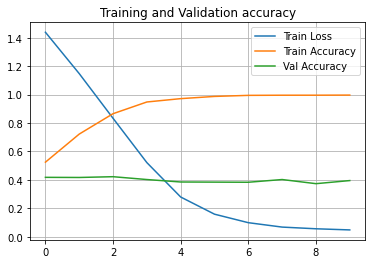

  0%|          | 0/129 [00:00<?, ?it/s]

RUN 2
epoch 1: 

100%|██████████| 129/129 [00:17<00:00,  7.37it/s]


epoch 1
loss: 1.452
Sentiment F1: 0.387
Sentiment Acc: 0.483
Sentiment F1: 0.335
Sentiment Acc: 0.426
NEW BEST DEV ACC: 0.426
saving model to saved_models/SST-fine/negation_scope/2/epochs:1-lstm_dim:100-lstm_layers:1-devacc:0.426.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 2: 

100%|██████████| 129/129 [00:17<00:00,  7.35it/s]


epoch 2
loss: 1.167
Sentiment F1: 0.700
Sentiment Acc: 0.713
Sentiment F1: 0.423
Sentiment Acc: 0.434
NEW BEST DEV ACC: 0.434
saving model to saved_models/SST-fine/negation_scope/2/epochs:2-lstm_dim:100-lstm_layers:1-devacc:0.434.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 3: 

100%|██████████| 129/129 [00:17<00:00,  7.31it/s]


epoch 3
loss: 0.867
Sentiment F1: 0.810
Sentiment Acc: 0.813


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.411
Sentiment Acc: 0.424
epoch 4: 

100%|██████████| 129/129 [00:17<00:00,  7.37it/s]


epoch 4
loss: 0.537
Sentiment F1: 0.932
Sentiment Acc: 0.934


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.411
Sentiment Acc: 0.411
epoch 5: 

100%|██████████| 129/129 [00:17<00:00,  7.35it/s]


epoch 5
loss: 0.299
Sentiment F1: 0.974
Sentiment Acc: 0.975


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.387
Sentiment Acc: 0.389
epoch 6: 

100%|██████████| 129/129 [00:17<00:00,  7.30it/s]


epoch 6
loss: 0.169
Sentiment F1: 0.982
Sentiment Acc: 0.982


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.397
Sentiment Acc: 0.407
epoch 7: 

100%|██████████| 129/129 [00:17<00:00,  7.22it/s]


epoch 7
loss: 0.111
Sentiment F1: 0.991
Sentiment Acc: 0.991


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.389
Sentiment Acc: 0.396
epoch 8: 

100%|██████████| 129/129 [00:17<00:00,  7.20it/s]


epoch 8
loss: 0.073
Sentiment F1: 0.995
Sentiment Acc: 0.995


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.389
Sentiment Acc: 0.391
epoch 9: 

100%|██████████| 129/129 [00:17<00:00,  7.27it/s]


epoch 9
loss: 0.053
Sentiment F1: 0.995
Sentiment Acc: 0.995


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.395
Sentiment Acc: 0.405
epoch 10: 

100%|██████████| 129/129 [00:17<00:00,  7.21it/s]


epoch 10
loss: 0.041
Sentiment F1: 0.998
Sentiment Acc: 0.998
Sentiment F1: 0.394
Sentiment Acc: 0.396


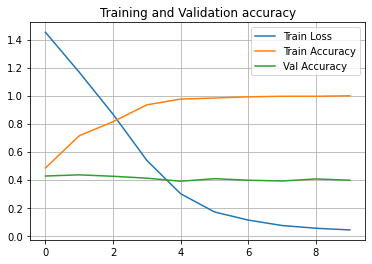

  0%|          | 0/129 [00:00<?, ?it/s]

RUN 3
epoch 1: 

100%|██████████| 129/129 [00:17<00:00,  7.22it/s]


epoch 1
loss: 1.445
Sentiment F1: 0.379
Sentiment Acc: 0.483
Sentiment F1: 0.327
Sentiment Acc: 0.420
NEW BEST DEV ACC: 0.420
saving model to saved_models/SST-fine/negation_scope/3/epochs:1-lstm_dim:100-lstm_layers:1-devacc:0.420.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 2: 

100%|██████████| 129/129 [00:17<00:00,  7.24it/s]


epoch 2
loss: 1.167
Sentiment F1: 0.703
Sentiment Acc: 0.710
Sentiment F1: 0.436
Sentiment Acc: 0.440
NEW BEST DEV ACC: 0.440
saving model to saved_models/SST-fine/negation_scope/3/epochs:2-lstm_dim:100-lstm_layers:1-devacc:0.440.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 3: 

100%|██████████| 129/129 [00:17<00:00,  7.22it/s]


epoch 3
loss: 0.863
Sentiment F1: 0.799
Sentiment Acc: 0.802


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.410
Sentiment Acc: 0.411
epoch 4: 

100%|██████████| 129/129 [00:17<00:00,  7.23it/s]


epoch 4
loss: 0.530
Sentiment F1: 0.937
Sentiment Acc: 0.939


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.381
Sentiment Acc: 0.379
epoch 5: 

100%|██████████| 129/129 [00:17<00:00,  7.30it/s]


epoch 5
loss: 0.280
Sentiment F1: 0.976
Sentiment Acc: 0.976


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.387
Sentiment Acc: 0.386
epoch 6: 

100%|██████████| 129/129 [00:17<00:00,  7.24it/s]


epoch 6
loss: 0.161
Sentiment F1: 0.990
Sentiment Acc: 0.990


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.394
Sentiment Acc: 0.397
epoch 7: 

100%|██████████| 129/129 [00:17<00:00,  7.17it/s]


epoch 7
loss: 0.100
Sentiment F1: 0.991
Sentiment Acc: 0.991


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.393
Sentiment Acc: 0.401
epoch 8: 

100%|██████████| 129/129 [00:17<00:00,  7.18it/s]


epoch 8
loss: 0.073
Sentiment F1: 0.995
Sentiment Acc: 0.995


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.393
Sentiment Acc: 0.399
epoch 9: 

100%|██████████| 129/129 [00:17<00:00,  7.29it/s]


epoch 9
loss: 0.057
Sentiment F1: 0.997
Sentiment Acc: 0.997


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.378
Sentiment Acc: 0.378
epoch 10: 

100%|██████████| 129/129 [00:17<00:00,  7.26it/s]


epoch 10
loss: 0.043
Sentiment F1: 0.997
Sentiment Acc: 0.997
Sentiment F1: 0.387
Sentiment Acc: 0.391


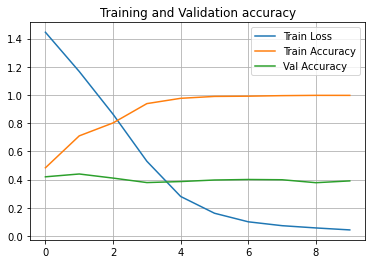

  0%|          | 0/129 [00:00<?, ?it/s]

RUN 4
epoch 1: 

100%|██████████| 129/129 [00:17<00:00,  7.19it/s]


epoch 1
loss: 1.438
Sentiment F1: 0.492
Sentiment Acc: 0.525
Sentiment F1: 0.389
Sentiment Acc: 0.424
NEW BEST DEV ACC: 0.424
saving model to saved_models/SST-fine/negation_scope/4/epochs:1-lstm_dim:100-lstm_layers:1-devacc:0.424.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 2: 

100%|██████████| 129/129 [00:17<00:00,  7.32it/s]


epoch 2
loss: 1.158
Sentiment F1: 0.694
Sentiment Acc: 0.701
Sentiment F1: 0.428
Sentiment Acc: 0.431
NEW BEST DEV ACC: 0.431
saving model to saved_models/SST-fine/negation_scope/4/epochs:2-lstm_dim:100-lstm_layers:1-devacc:0.431.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 3: 

100%|██████████| 129/129 [00:17<00:00,  7.30it/s]


epoch 3
loss: 0.865
Sentiment F1: 0.836
Sentiment Acc: 0.841
Sentiment F1: 0.414
Sentiment Acc: 0.438
NEW BEST DEV ACC: 0.438
saving model to saved_models/SST-fine/negation_scope/4/epochs:3-lstm_dim:100-lstm_layers:1-devacc:0.438.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 4: 

100%|██████████| 129/129 [00:17<00:00,  7.23it/s]


epoch 4
loss: 0.546
Sentiment F1: 0.945
Sentiment Acc: 0.946


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.405
Sentiment Acc: 0.407
epoch 5: 

100%|██████████| 129/129 [00:17<00:00,  7.29it/s]


epoch 5
loss: 0.291
Sentiment F1: 0.975
Sentiment Acc: 0.976


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.391
Sentiment Acc: 0.391
epoch 6: 

100%|██████████| 129/129 [00:17<00:00,  7.29it/s]


epoch 6
loss: 0.166
Sentiment F1: 0.989
Sentiment Acc: 0.989


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.385
Sentiment Acc: 0.390
epoch 7: 

100%|██████████| 129/129 [00:17<00:00,  7.25it/s]


epoch 7
loss: 0.106
Sentiment F1: 0.992
Sentiment Acc: 0.993


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.382
Sentiment Acc: 0.384
epoch 8: 

100%|██████████| 129/129 [00:18<00:00,  7.14it/s]


epoch 8
loss: 0.078
Sentiment F1: 0.991
Sentiment Acc: 0.990


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.392
Sentiment Acc: 0.387
epoch 9: 

100%|██████████| 129/129 [00:17<00:00,  7.17it/s]


epoch 9
loss: 0.065
Sentiment F1: 0.995
Sentiment Acc: 0.995


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.382
Sentiment Acc: 0.384
epoch 10: 

100%|██████████| 129/129 [00:17<00:00,  7.23it/s]


epoch 10
loss: 0.042
Sentiment F1: 0.998
Sentiment Acc: 0.998
Sentiment F1: 0.387
Sentiment Acc: 0.387


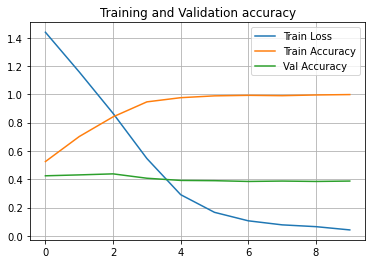

  0%|          | 0/129 [00:00<?, ?it/s]

RUN 5
epoch 1: 

100%|██████████| 129/129 [00:17<00:00,  7.17it/s]


epoch 1
loss: 1.447
Sentiment F1: 0.414
Sentiment Acc: 0.493
Sentiment F1: 0.346
Sentiment Acc: 0.426
NEW BEST DEV ACC: 0.426
saving model to saved_models/SST-fine/negation_scope/5/epochs:1-lstm_dim:100-lstm_layers:1-devacc:0.426.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 2: 

100%|██████████| 129/129 [00:18<00:00,  7.15it/s]


epoch 2
loss: 1.159
Sentiment F1: 0.638
Sentiment Acc: 0.678
Sentiment F1: 0.383
Sentiment Acc: 0.429
NEW BEST DEV ACC: 0.429
saving model to saved_models/SST-fine/negation_scope/5/epochs:2-lstm_dim:100-lstm_layers:1-devacc:0.429.pth


  0%|          | 0/129 [00:00<?, ?it/s]


epoch 3: 

100%|██████████| 129/129 [00:17<00:00,  7.24it/s]


epoch 3
loss: 0.853
Sentiment F1: 0.868
Sentiment Acc: 0.870


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.420
Sentiment Acc: 0.414
epoch 4: 

100%|██████████| 129/129 [00:18<00:00,  7.15it/s]


epoch 4
loss: 0.519
Sentiment F1: 0.944
Sentiment Acc: 0.944


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.382
Sentiment Acc: 0.392
epoch 5: 

100%|██████████| 129/129 [00:17<00:00,  7.20it/s]


epoch 5
loss: 0.283
Sentiment F1: 0.976
Sentiment Acc: 0.976


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.389
Sentiment Acc: 0.391
epoch 6: 

100%|██████████| 129/129 [00:17<00:00,  7.26it/s]


epoch 6
loss: 0.157
Sentiment F1: 0.987
Sentiment Acc: 0.987


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.398
Sentiment Acc: 0.400
epoch 7: 

100%|██████████| 129/129 [00:17<00:00,  7.18it/s]


epoch 7
loss: 0.107
Sentiment F1: 0.993
Sentiment Acc: 0.993


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.405
Sentiment Acc: 0.404
epoch 8: 

100%|██████████| 129/129 [00:17<00:00,  7.20it/s]


epoch 8
loss: 0.069
Sentiment F1: 0.996
Sentiment Acc: 0.996


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.406
Sentiment Acc: 0.404
epoch 9: 

100%|██████████| 129/129 [00:18<00:00,  7.16it/s]


epoch 9
loss: 0.051
Sentiment F1: 0.997
Sentiment Acc: 0.997


  0%|          | 0/129 [00:00<?, ?it/s]

Sentiment F1: 0.402
Sentiment Acc: 0.410
epoch 10: 

100%|██████████| 129/129 [00:18<00:00,  7.13it/s]


epoch 10
loss: 0.038
Sentiment F1: 0.998
Sentiment Acc: 0.998
Sentiment F1: 0.387
Sentiment Acc: 0.385


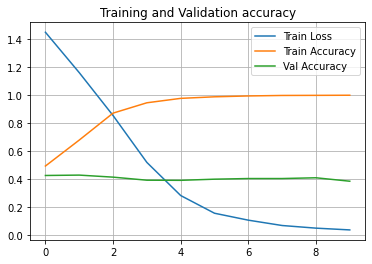

In [ ]:
    train_model(vocab,
                new_matrix,
                tag_to_ix,
                len(sst.labels),
                task2label2id,
                args.EMBEDDING_DIM,
                args.HIDDEN_DIM,
                args.NUM_LAYERS,
                args.TRAIN_EMBEDDINGS,
                auxiliary_trainX,
                auxiliary_trainY,
                auxiliary_testX,
                auxiliary_testY,
                maintask_loader,
                maintask_train_iter,
                maintask_dev_iter,
                AUXILIARY_TASK=args.AUXILIARY_TASK,
                epochs=10, 
                sentiment_learning_rate=args.SENTIMENT_LR,
                auxiliary_learning_rate=args.AUXILIARY_LR,
                BATCH_SIZE=2,
                number_of_runs=5,
                random_seeds=[123, 456, 789, 101112, 131415],
                DATASET=args.DATASET,
                FINE_GRAINED=args.FINE_GRAINED
                )

In [ ]:
%tensorboard --logdir runs

<IPython.core.display.Javascript object>